# Covid-19 epidemiologic data

In [1]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm

from wavy import panel
from wavy import frequency
from wavy import utils

In [2]:
csv_path = '/home/amandacasadei/Downloads/WHO-COVID-19-global-data.csv'
df = pd.read_csv(csv_path)

In [3]:
df.head()

,Date_reported,Country_code,Country,WHO_region,New_cases,Cumulative_cases,New_deaths,Cumulative_deaths
0,2020-01-03,AF,Afghanistan,EMRO,0,0,0,0
1,2020-01-04,AF,Afghanistan,EMRO,0,0,0,0
2,2020-01-05,AF,Afghanistan,EMRO,0,0,0,0
3,2020-01-06,AF,Afghanistan,EMRO,0,0,0,0
4,2020-01-07,AF,Afghanistan,EMRO,0,0,0,0


### Preprocessing:

In [4]:
df.drop(columns=['Country_code', 'WHO_region'], inplace=True)

In [5]:
countries = pd.unique(df['Country'])

processed = pd.DataFrame()
for country in tqdm(countries):
    temp_df = df.loc[df['Country'] == country]
    temp_df = temp_df.drop(columns=['Country'])
    date_time = pd.to_datetime(temp_df.pop('Date_reported'), format='%Y.%m.%d')
    temp_df.index = date_time
    temp_df.columns = pd.MultiIndex.from_product([[country], temp_df.columns])
    processed = pd.concat([processed, temp_df], axis=1)

100%|██████████| 237/237 [00:03<00:00, 77.25it/s]


In [9]:
processed

Afghanistan                                                \
                New_cases Cumulative_cases New_deaths Cumulative_deaths   
Date_reported                                                             
2020-01-03              0                0          0                 0   
2020-01-04              0                0          0                 0   
2020-01-05              0                0          0                 0   
2020-01-06              0                0          0                 0   
2020-01-07              0                0          0                 0   
...                   ...              ...        ...               ...   
2022-01-06             38           158245          1              7367   
2022-01-07              0           158245          0              7367   
2022-01-08              0           158245          0              7367   
2022-01-09              0           158245          0              7367   
2022-01-10            136           158381          6              7373   

                Albania                                                \
              New_cases Cumulative_cases New_deaths Cumulative_deaths   
Date_reported                                                           
2020-01-03            0                0          0                 0   
2020-01-04            0                0          0                 0   
2020-01-05            0                0          0                 0   
2020-01-06            0                0          0                 0   
2020-01-07            0                0          0                 0   
...                 ...              ...        ...               ...   
2022-01-06         1236           213257          4              3228   
2022-01-07         1648           214905          5              3233   
2022-01-08         1781           216686          0              3233   
2022-01-09         1801           218487          4              3237   
2022-01-10         1207           219694          3              3240   

                Algeria                   ...      Yemen                    \
              New_cases Cumulative_cases  ... New_deaths Cumulative_deaths   
Date_reported                             ...                                
2020-01-03            0                0  ...          0                 0   
2020-01-04            0                0  ...          0                 0   
2020-01-05            0                0  ...          0                 0   
2020-01-06            0                0  ...          0                 0   
2020-01-07            0                0  ...          0                 0   
...                 ...              ...  ...        ...               ...   
2022-01-06          462           220415  ...          1              1985   
2022-01-07          410           220825  ...          0              1985   
2022-01-08          491           221316  ...          0              1985   
2022-01-09          426           221742  ...          0              1985   
2022-01-10          415           222157  ...          1              1986   

                 Zambia                                                \
              New_cases Cumulative_cases New_deaths Cumulative_deaths   
Date_reported                                                           
2020-01-03            0                0          0                 0   
2020-01-04            0                0          0                 0   
2020-01-05            0                0          0                 0   
2020-01-06            0                0          0                 0   
2020-01-07            0                0          0                 0   
...                 ...              ...        ...               ...   
2022-01-06         8770           269991         19              3772   
2022-01-07         4096           274087         10              3782   
2022-01-08         4189           278276    

### Load dataframe into wavy panel:

In [10]:
panel_ = panel.from_data(processed, lookback=10, horizon=1, 
                         assets=['Brazil', 'Argentina'], channels=['New_cases', 'New_deaths'])

In [11]:
panel_

size                             729
lookback                          10
horizon                            1
gap                                0
num_xassets                        2
num_yassets                        2
num_xchannels                      2
num_ychannels                      2
start            2020-01-03 00:00:00
end              2022-01-10 00:00:00
Name: Panel, dtype: object


<Panel, size 729>

In [13]:
panel_.x[-1]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-12-31         9128        112     42032         26
2022-01-01        13405        167     50506         35
2022-01-02        10282         72     67683         35
2022-01-03         3986         49         0          0
2022-01-04         1721         28     20502         23
2022-01-05        11850         76     44396         41
2022-01-06        18759        175     81210         49
2022-01-07        27267        129     95159         52
2022-01-08        35826        128    109608         40
2022-01-09        63292        181    110533         42

In [15]:
panel_.y[-1]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2022-01-10        49303        115    101689         37

In [16]:
panel_.x.shape

  0%|          | 0/729 [00:00<?, ?it/s]

(729, 2, 10, 2)

In [17]:
panel_.y.shape

  0%|          | 0/729 [00:00<?, ?it/s]

(729, 2, 1, 2)

In [40]:
panel_.findna()

  0%|          | 0/729 [00:00<?, ?it/s]

  0%|          | 0/729 [00:00<?, ?it/s]

[]

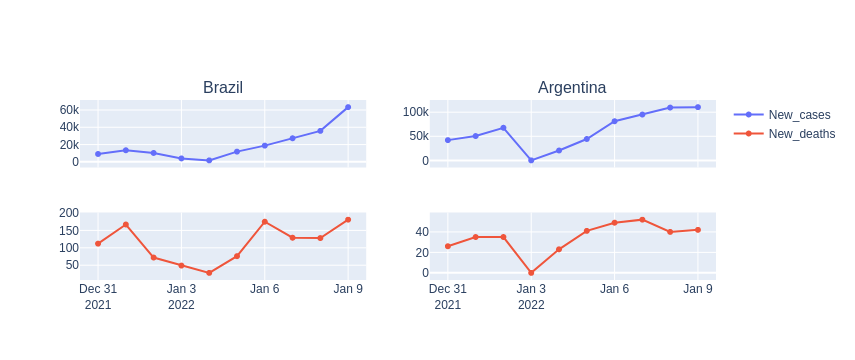

In [31]:
panel_.x[-1].plot()

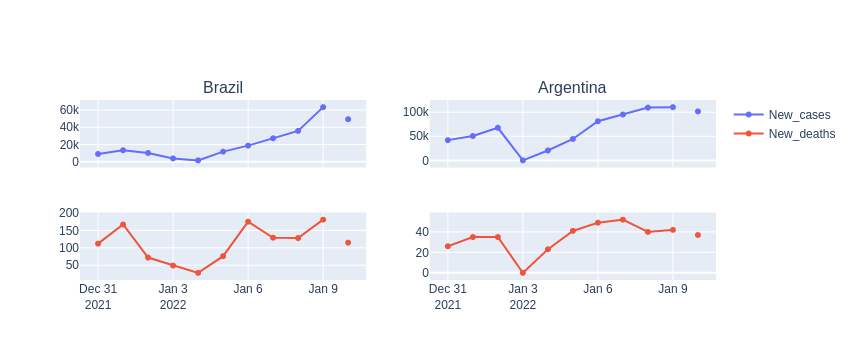

In [37]:
panel_.plot_block(-1)

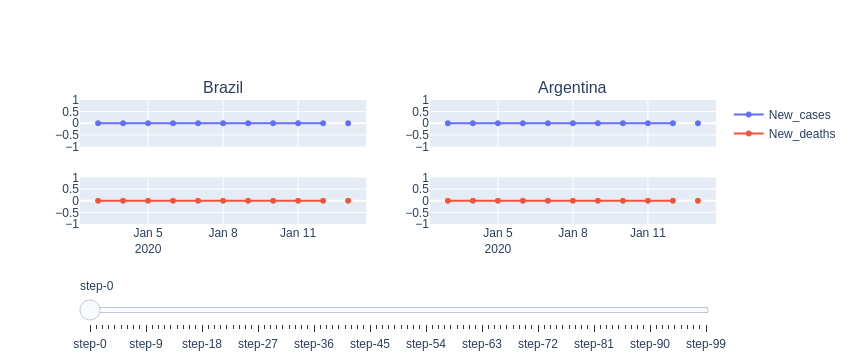

In [39]:
panel_.plot_slider()
#phyno!

### Train models:

In [41]:
panel_.set_training_split() #use default values of .2 for validation and .1 for test set

In [50]:
train = panel_.train
test = panel_.test
val = panel_.val

In [54]:
train.x[-1]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-06-11        85748       2723     29757        605
2021-06-12        88092       2504     27628        669
2021-06-13        85149       2216     26934        687
2021-06-14        78700       2037     18057        447
2021-06-15        37948       1129     13043        268
2021-06-16        39846        827     21292        686
2021-06-17        80609       2468     27260        586
2021-06-18        95367       2997     25878        646
2021-06-19        74042       2311     23780        528
2021-06-20        98832       2495     20363        458

In [55]:
from wavy import nn

### Baseline

In [58]:
baseline = nn.Baseline(panel_, metrics=['SE', 'MSE', 'RMSE'])

In [59]:
predicted = baseline.predict()

In [67]:
predicted[0]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-10-31        15268        389      1589         27

In [69]:
panel_.test.y[0]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-10-31        11965        394      2185         26

In [72]:
baseline.evaluate('test')

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

[10536245773, 36584186.71180555, 6048.486315749218]

In [74]:
predicted_val = baseline.predict_val()

In [75]:
baseline.evaluate('val')

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

ValueError: operands could not be broadcast together with shapes (131,1,4) (72,1,4) 

In [78]:
panel_.val.y[5]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-06-27        79277       2001     24023        541

In [86]:
predicted_val[5]

Brazil            Argentina           
              New_cases New_deaths New_cases New_deaths
Date_reported                                          
2021-06-27        73602       2032     24463        452

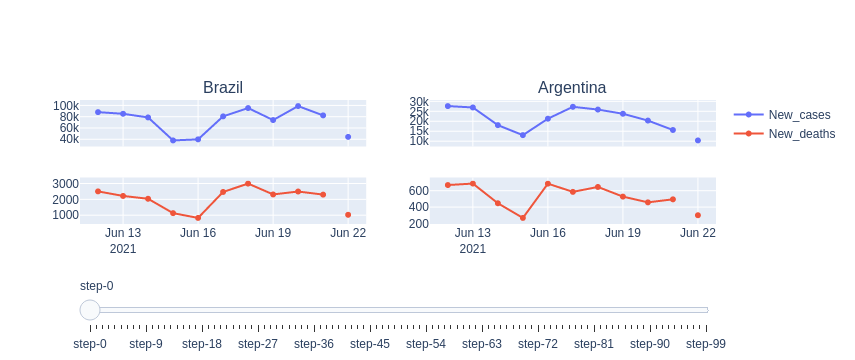

In [105]:
panel_.val.plot_slider()

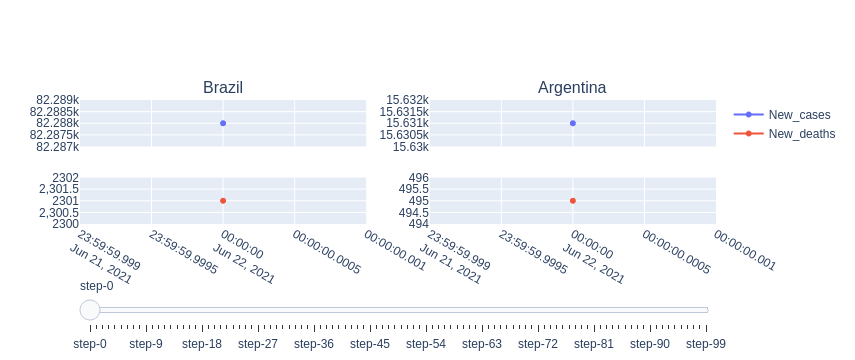

In [107]:
predicted_val.plot_slider()

### Dense

In [114]:
densemodel = nn.DenseModel(panel_, model_type="regression", dense_layers=4, optimizer='ADAM', loss='MSE')

  0%|          | 0/526 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/526 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

In [115]:
densemodel.fit()

17/17 [==============================] - 0s 7ms/step - loss: 133315624.0000 - MAE: 7219.9067 - val_loss: 127813160.0000 - val_MAE: 6318.5488


In [116]:
densemodel.model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_5 (Flatten)         (None, 40)                0         
                                                                 
 dense_10 (Dense)            (None, 32)                1312      
                                                                 
 dense_11 (Dense)            (None, 4)                 132       
                                                                 
 reshape_5 (Reshape)         (None, 1, 4)              0         
                                                                 
Total params: 1,444
Trainable params: 1,444
Non-trainable params: 0
_________________________________________________________________


In [117]:
predicted = densemodel.predict()

In [118]:
densemodel.evaluate('test')

3/3 [==============================] - 0s 2ms/step - loss: 345578976.0000 - MAE: 6485.7402


[345578976.0, 6485.740234375]

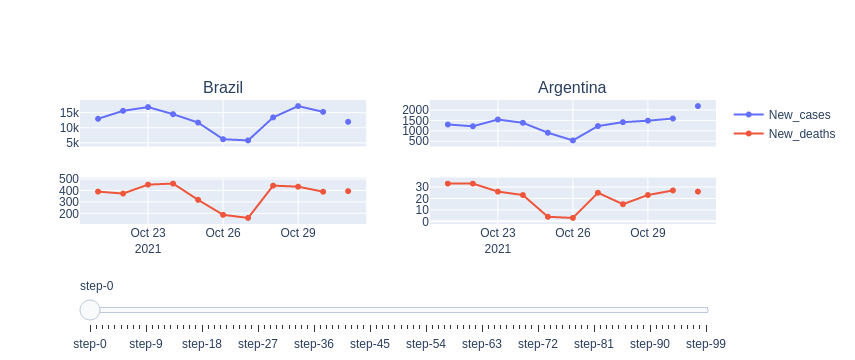

In [119]:
panel_.test.plot_slider()

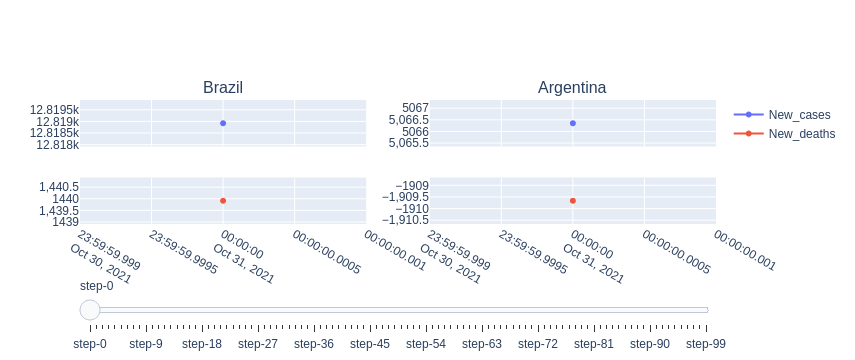

In [120]:
predicted.plot_slider()

In [122]:
predicted_val = densemodel.predict_val()

In [123]:
densemodel.evaluate('val')

5/5 [==============================] - 0s 1ms/step - loss: 127813160.0000 - MAE: 6318.5488


[127813160.0, 6318.548828125]

In [ ]:
panel_.val.plot_slider()

In [ ]:
predicted_val.plot_slider()

### ConvModel

In [128]:
convmodel = nn.ConvModel(panel_, model_type="regression", kernel_size=2)

  0%|          | 0/526 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/526 [00:00<?, ?it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

In [131]:
convmodel.fit()

TypeError: in user code:

    File "/home/amandacasadei/anaconda3/lib/python3.7/site-packages/keras/engine/training.py", line 878, in train_function  *
        return step_function(self, iterator)
    File "/home/amandacasadei/anaconda3/lib/python3.7/site-packages/keras/engine/training.py", line 867, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/amandacasadei/anaconda3/lib/python3.7/site-packages/keras/engine/training.py", line 860, in run_step  **
        outputs = model.train_step(data)
    File "/home/amandacasadei/anaconda3/lib/python3.7/site-packages/keras/engine/training.py", line 808, in train_step
        y_pred = self(x, training=True)
    File "/home/amandacasadei/anaconda3/lib/python3.7/site-packages/keras/utils/traceback_utils.py", line 67, in error_handler
        raise e.with_traceback(filtered_tb) from None

    TypeError: Exception encountered when calling layer "conv1d_1" (type Conv1D).
    
    Value passed to parameter 'input' has DataType int64 not in list of allowed values: float16, bfloat16, float32, float64, int32
    
    Call arguments received:
      • inputs=tf.Tensor(shape=(None, 10, 4), dtype=int64)


In [130]:
convmodel.model.summary()

ValueError: This model has not yet been built. Build the model first by calling `build()` or by calling the model on a batch of data.